In [1]:
import pandas as pd
import plotly.express as px
import numpy as np 
import os
import matplotlib.pyplot as plt
import ast
import plotly.graph_objects as go
import warnings
warnings.filterwarnings('ignore')
import seaborn as sns

In [2]:
# Set the path to your results folder
results_folder_path = r"C:\Users\krtej\Jupyter_folder\Standalone Projects\Results"

# Initialize empty DataFrames for each type
df_list = ['day', '60minute', '38minute']

# Iterate through the list of DataFrame names
for df_name in df_list:
    # Initialize an empty DataFrame for the current type
    current_df = pd.DataFrame()
    
    # Iterate through all folders in the results folder
    for folder_name in os.listdir(results_folder_path):
        folder_path = os.path.join(results_folder_path, folder_name)
        
        # Check if the item in the folder is a directory
        if os.path.isdir(folder_path):
            
            # Read the DataFrame from each folder based on the current type
            df = pd.read_csv(os.path.join(folder_path, f'{df_name}.csv'))
            
            # Add a new column with the folder name
            df['Strategy'] = folder_name
            
            # Concatenate the DataFrames
            current_df = pd.concat([current_df, df], ignore_index=True)
    
    # Add "_df" suffix to the DataFrame name
    df_name_with_suffix = f'df_{df_name}'
    
    # Assign the resulting DataFrame to the corresponding variable
    globals()[df_name_with_suffix] = current_df

## Profitability Analysis

In [3]:
def convert_to_list(cell_value):
    try:
        # Use ast.literal_eval to safely evaluate the string representation
        return ast.literal_eval(cell_value)
    except (SyntaxError, ValueError):
        return cell_value  # Return the original value if evaluation fails

def extract_fourth_element(lst):
    if len(lst) >= 4:
        return lst[3]
    else:
        return None

### Day 

In [4]:
grouped_df = df_day.groupby('Profit_Loss_Windows')

In [5]:

dfs = {}
# Iterate through groups, drop 'Profit_Loss_Windows', and store DataFrames in the dictionary
for name, group in grouped_df:
    dfs[name] = group.drop(columns=['Profit_Loss_Windows']).copy()

for key, df in dfs.items():
    dfs[key] = df.map(convert_to_list)

# Extract the fourth element from each DataFrame in the dictionary
for key, df in dfs.items():
    # Apply the function to all columns except the last one
    df.iloc[:, :-1] = df.iloc[:, :-1].apply(lambda col: col.map(extract_fourth_element))
for key, df in dfs.items():
    df['Average']= df.iloc[:,:-1].mean(axis=1)

In [6]:
dfs['(1, 0.33)']

,ACC,ADANIENT,ADANIGREEN,ADANIPORTS,AMBUJACEM,APOLLOHOSP,ASIANPAINT,AUROPHARMA,AXISBANK,BAJAJ-AUTO,...,TECHM,TITAN,TORNTPHARM,ULTRACEMCO,UPL,VEDL,WIPRO,YESBANK,Strategy,Average
0,32.61,58.14,28.57,57.41,44.44,42.22,53.33,48.05,45.1,43.86,...,51.02,43.48,54.17,41.82,38.71,37.25,42.59,51.61,BB,45.514455
4,32.26,50.0,14.29,50.0,43.75,42.42,45.45,42.31,38.71,37.84,...,45.45,36.36,51.72,50.0,42.86,36.36,36.84,54.35,BBRSI,46.073861
8,34.09,57.14,28.57,58.0,45.1,40.91,51.22,48.65,44.0,44.64,...,51.06,39.53,55.32,41.82,37.93,36.96,45.28,51.61,BBRSI-UC,45.846337
12,47.83,45.0,37.5,36.67,34.62,21.74,59.26,40.91,50.0,33.33,...,57.14,29.63,36.36,50.0,40.0,43.75,47.06,50.0,MA,41.580396
16,0.0,50.0,0.0,33.33,100.0,100.0,0.0,100.0,33.33,33.33,...,0.0,75.0,100.0,50.0,0.0,100.0,0.0,0.0,MARSI-C,30.445446
20,0.0,0.0,100.0,0.0,0.0,100.0,0.0,50.0,0.0,50.0,...,0.0,0.0,66.67,0.0,0.0,0.0,100.0,100.0,MARSI-UC1,30.445644
24,25.0,33.33,100.0,0.0,40.0,33.33,50.0,50.0,0.0,71.43,...,25.0,33.33,40.0,50.0,0.0,33.33,50.0,100.0,MARSI-UC2,41.608317
28,40.66,47.92,33.33,42.27,56.79,47.06,41.27,41.74,40.91,45.65,...,40.22,54.67,49.37,44.83,51.22,42.2,46.08,48.28,RSI,45.474851


In [7]:
def plot_profitability(dfs):
    for df_name, df in dfs.items():
        # Extract company names and folder values
        companies = df.iloc[:, :-2]
        folders = df.iloc[:, -2]

        # Create a DataFrame for plotting
        plot_data = pd.DataFrame(columns=['Company', 'Strategy', 'Value'])

        for company in companies.columns:
            company_data = pd.DataFrame({
                'Company': [company] * len(folders),
                'Strategy': folders.values,
                'Value': df[company]
            })
            plot_data = pd.concat([plot_data, company_data])

        # Convert 'Folder' column to categorical with specified order
        plot_data['Strategy'] = pd.Categorical(plot_data['Strategy'], categories=sorted(folders.unique()))

        # Calculate average values for each company
        avg_values = plot_data.groupby('Company')['Value'].mean().reset_index()
        avg_values_company = plot_data.groupby('Company')['Value'].mean().reset_index()

        # Calculate the overall mean
        overall_mean = plot_data['Value'].mean()

        # Plotting using Seaborn
        fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(40, 8), gridspec_kw={'height_ratios': [5, 3]})

        # Scatter Plot
        sns.scatterplot(data=plot_data, x='Company', y='Value', hue='Strategy', ax=axes[0])
        axes[0].set_title(f'Scatter Plot for {df_name}')
        axes[0].set_ylabel('Percentage of Profitable Trades')
        axes[0].legend(title='Strategy', bbox_to_anchor=(1.05, 1), loc='upper left')

        # Dotted Line Plots
        sns.lineplot(data=avg_values, x='Company', y='Value', ax=axes[1], color='red', linestyle='dashed', label='Average Value')
        axes[1].axhline(overall_mean, color='black', linestyle='dashed', label='Overall Mean') 
        axes[1].text(0.5, overall_mean, f'{overall_mean:.2f}', color='black', ha='center', va='bottom', fontsize=12)
        axes[1].set_xlabel('Company')
        axes[1].set_ylabel('Value')
        axes[1].legend()

        # Rotate x-axis labels for better readability
        # plt.setp(axes[0].xaxis.get_majorticklabels(), rotation=45)
        axes[0].set_xticks([])
        plt.setp(axes[1].xaxis.get_majorticklabels(), rotation=45)

        # Adjust layout
        plt.tight_layout()

        # Show the plot
        plt.show()

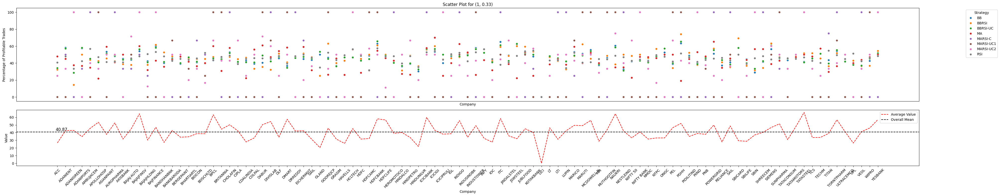

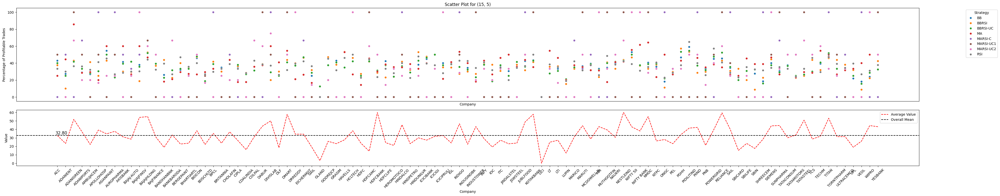

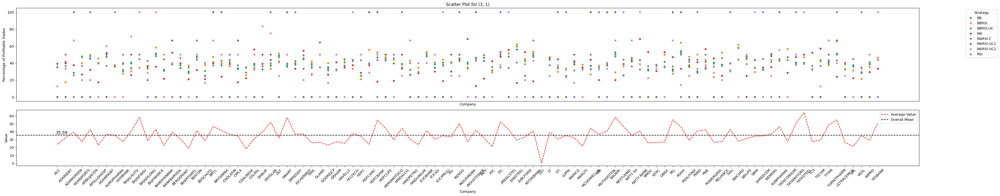

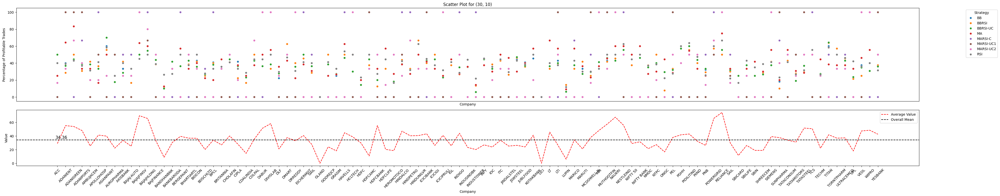

In [8]:
plot_profitability(dfs)

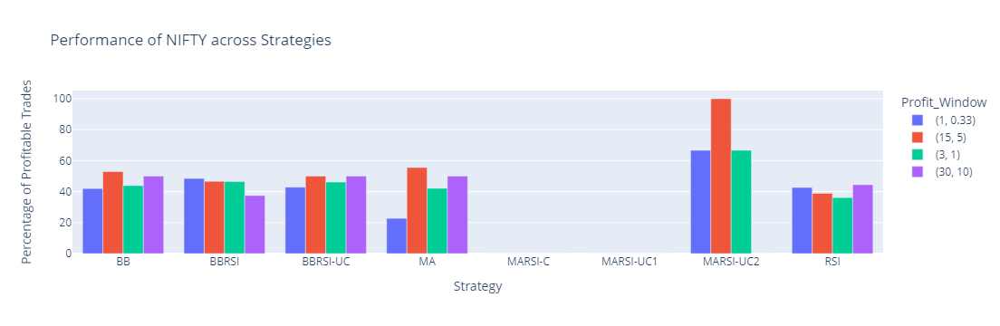

In [9]:


# Create a list of DataFrames containing NIFTY 50, Strategy, and Average columns for each profit window
nifty_dfs = [df[['NIFTY 50', 'Strategy', 'Average']].assign(Profit_Window=profit_window) for profit_window, df in dfs.items()]

# Concatenate the DataFrames
combined_nifty_df = pd.concat(nifty_dfs, ignore_index=True)

# Create a grouped bar chart using Plotly Express
fig = px.bar(combined_nifty_df, x='Strategy', y='NIFTY 50', color='Profit_Window',
             title='Performance of NIFTY across Strategies',
             labels={'NIFTY 50': 'Percentage of Profitable Trades', 'Strategy': 'Strategy'},
             barmode='group')  # Set barmode to 'group' for grouped bars


# Show the plot
fig.show()


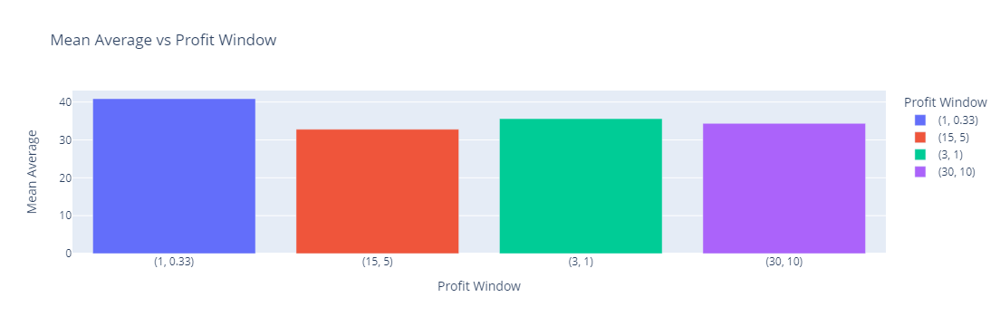

In [10]:
# Calculate the mean of the 'Profit_Window' values
mean_average_by_profit_window = combined_nifty_df.groupby('Profit_Window')['Average'].mean().reset_index()

# Drop rows with NaN values
mean_average_by_profit_window = mean_average_by_profit_window.dropna()

# Create a bar chart using Plotly Express
fig_bar = px.bar(mean_average_by_profit_window, x='Profit_Window', y='Average',
                 color='Profit_Window',
                 labels={'Average': 'Mean Average', 'Profit_Window': 'Profit Window'},
                 title='Mean Average vs Profit Window')

# Show the plot
fig_bar.show()

# Store the values in average_df
average_df = mean_average_by_profit_window.copy()
average_df.rename(columns={'Average': 'Day'}, inplace=True)


In [11]:
## Most profitable company, 

In [12]:
def find_maximum_value_info(dfs):
    max_value_info = {'key': None, 'column_name': None, 'strategy_value': None, 'max_value': float('-inf')}

    for key, df in dfs.items():
        for column in df.columns:
            if column not in ['Strategy'] and df.loc[df[column].idxmax(), 'Strategy'] not in ['MARSI-C', 'MARSI-UC1', 'MARSI-UC2']:
                max_value = df[column].max()
                if max_value > max_value_info['max_value']:
                    max_value_info['key'] = key
                    max_value_info['column_name'] = column
                    max_value_info['strategy_value'] = df.loc[df[column].idxmax(), 'Strategy']
                    max_value_info['max_value'] = max_value

    return max_value_info

# Assuming 'dfs' is your dictionary of dataframes
result = find_maximum_value_info(dfs)

result

{'key': '(1, 0.33)',
 'column_name': 'ICICIGI',
 'strategy_value': 'MA',
 'max_value': 70.0}

In [13]:
for i in range(len(df_day)):
    if df_day.loc[i, 'Profit_Loss_Windows'] == '(1, 0.33)' and df_day.loc[i, 'Strategy'] == 'MA':
        val = i
        print(df_day.loc[i, 'ICICIGI'])

[10, 7, 3, 70.0, 2.0]


In [14]:
def most_profitable_strategy(dfs):
    max_values = []

    for key, df in dfs.items():
        # Calculate row-wise average for each row
        row_avg = df.iloc[:, :-2].mean(axis=1)  # Assuming profitability columns start from the third column
        max_avg_value = row_avg.max()

        # Get the strategy corresponding to the maximum average
        max_strategy = df.loc[row_avg.idxmax(), 'Strategy']

        max_values.append({'key': key, 'strategy': max_strategy, 'max_value': max_avg_value})

    # Find the maximum value across the three strategies
    result = max(max_values, key=lambda x: x['max_value'])

    return result

# Assuming 'dfs' is your dictionary of dataframes
result = most_profitable_strategy(dfs)

print("Most Profitable Strategy:", result['strategy'])
print("Maximum Average Profitability:", result['max_value'])
print("Key (DataFrame Identifier):", result['key'])

Most Profitable Strategy: BBRSI
Maximum Average Profitability: 46.07386138613862
Key (DataFrame Identifier): (1, 0.33)


### Hour

In [15]:
grouped_df = df_60minute.groupby('Profit_Loss_Windows')

In [16]:
dfs = {}
# Iterate through groups, drop 'Profit_Loss_Windows', and store DataFrames in the dictionary
for name, group in grouped_df:
    dfs[name] = group.drop(columns=['Profit_Loss_Windows']).copy()

for key, df in dfs.items():
    dfs[key] = df.map(convert_to_list)

# Extract the fourth element from each DataFrame in the dictionary
for key, df in dfs.items():
    # Apply the function to all columns except the last one
    df.iloc[:, :-1] = df.iloc[:, :-1].apply(lambda col: col.map(extract_fourth_element))
for key, df in dfs.items():
    df['Average']= df.iloc[:,:-1].mean(axis=1)

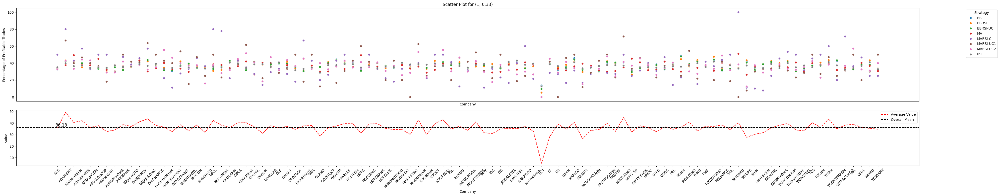

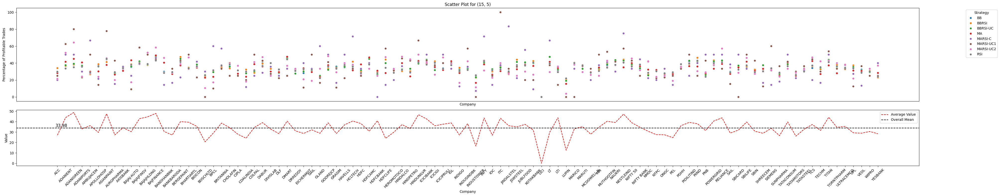

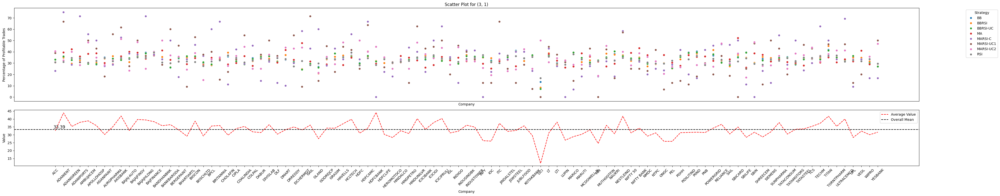

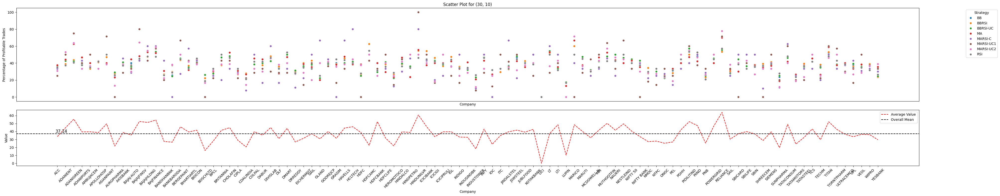

In [17]:
plot_profitability(dfs)

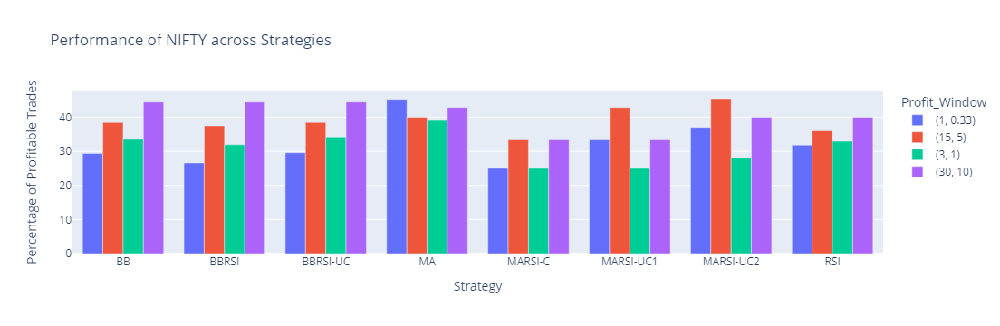

In [18]:
# Create a list of DataFrames containing NIFTY 50, Strategy, and Average columns for each profit window
nifty_dfs = [df[['NIFTY 50', 'Strategy', 'Average']].assign(Profit_Window=profit_window) for profit_window, df in dfs.items()]

# Concatenate the DataFrames
combined_nifty_df = pd.concat(nifty_dfs, ignore_index=True)

# Create a grouped bar chart using Plotly Express
fig = px.bar(combined_nifty_df, x='Strategy', y='NIFTY 50', color='Profit_Window',
             title='Performance of NIFTY across Strategies',
             labels={'NIFTY 50': 'Percentage of Profitable Trades', 'Strategy': 'Strategy'},
             barmode='group')  # Set barmode to 'group' for grouped bars


# Show the plot
fig.show()

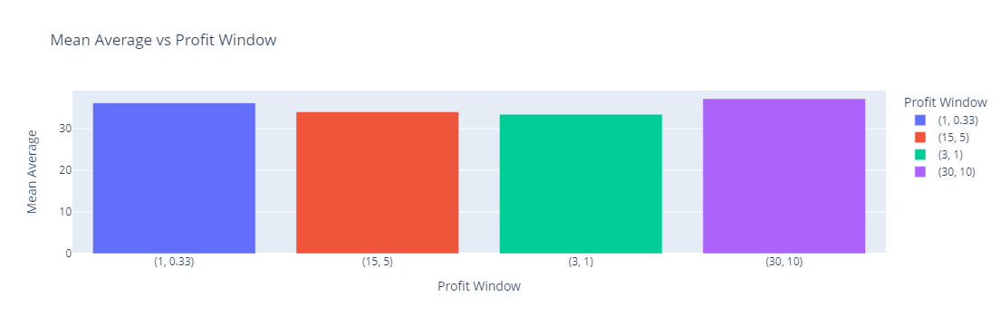

In [19]:
# Calculate the mean of the 'Profit_Window' values
mean_average_by_profit_window = combined_nifty_df.groupby('Profit_Window')['Average'].mean().reset_index()

# Drop rows with NaN values
mean_average_by_profit_window = mean_average_by_profit_window.dropna()

# Create a bar chart using Plotly Express
fig_bar = px.bar(mean_average_by_profit_window, x='Profit_Window', y='Average',
                 color='Profit_Window',
                 labels={'Average': 'Mean Average', 'Profit_Window': 'Profit Window'},
                 title='Mean Average vs Profit Window')

# Show the plot
fig_bar.show()

average_df1 = mean_average_by_profit_window.copy()
average_df1.rename(columns={'Average': 'Hour'}, inplace=True)

average_df = pd.merge(average_df, average_df1[['Profit_Window', 'Hour']], on='Profit_Window', how='left')

In [20]:
# Assuming 'dfs' is your dictionary of dataframes
result = find_maximum_value_info(dfs)

result

{'key': '(30, 10)',
 'column_name': 'HDFCBANK',
 'strategy_value': 'BBRSI',
 'max_value': 62.5}

In [21]:
for i in range(len(df_60minute)):
    if df_60minute.loc[i, 'Profit_Loss_Windows'] == result['key'] and df_60minute.loc[i, 'Strategy'] == result['strategy_value']:
        val = i
        print(df_60minute.loc[i, result['column_name']])

[8, 5, 2, 62.5, 1123.0]


In [22]:
result = most_profitable_strategy(dfs)

print("Most Profitable Strategy:", result['strategy'])
print("Maximum Average Profitability:", result['max_value'])
print("Key (DataFrame Identifier):", result['key'])

Most Profitable Strategy: BBRSI
Maximum Average Profitability: 38.467623762376235
Key (DataFrame Identifier): (30, 10)


## 38_minutes

In [23]:
grouped_df = df_38minute.groupby('Profit_Loss_Windows')

In [24]:
dfs = {}
# Iterate through groups, drop 'Profit_Loss_Windows', and store DataFrames in the dictionary
for name, group in grouped_df:
    dfs[name] = group.drop(columns=['Profit_Loss_Windows']).copy()

for key, df in dfs.items():
    dfs[key] = df.map(convert_to_list)

# Extract the fourth element from each DataFrame in the dictionary
for key, df in dfs.items():
    # Apply the function to all columns except the last one
    df.iloc[:, :-1] = df.iloc[:, :-1].apply(lambda col: col.map(extract_fourth_element))
for key, df in dfs.items():
    df['Average']= df.iloc[:,:-1].mean(axis=1)

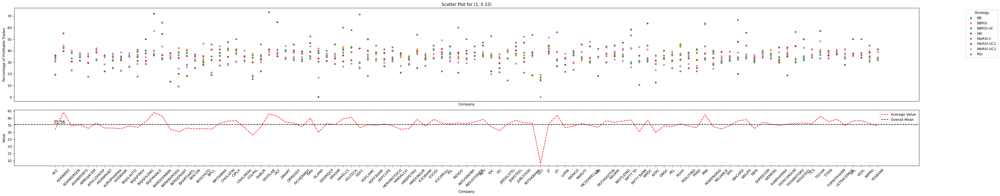

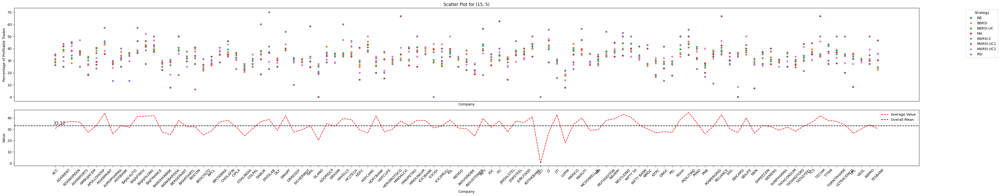

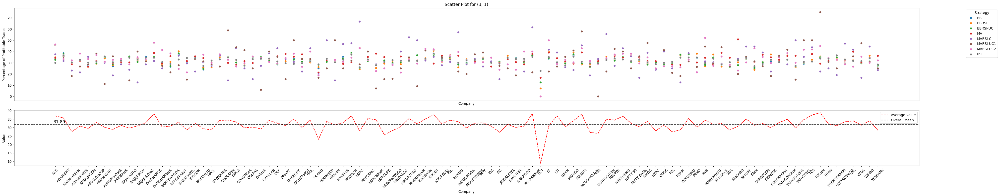

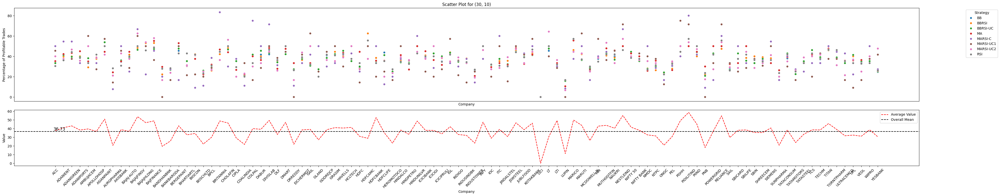

In [25]:
plot_profitability(dfs)

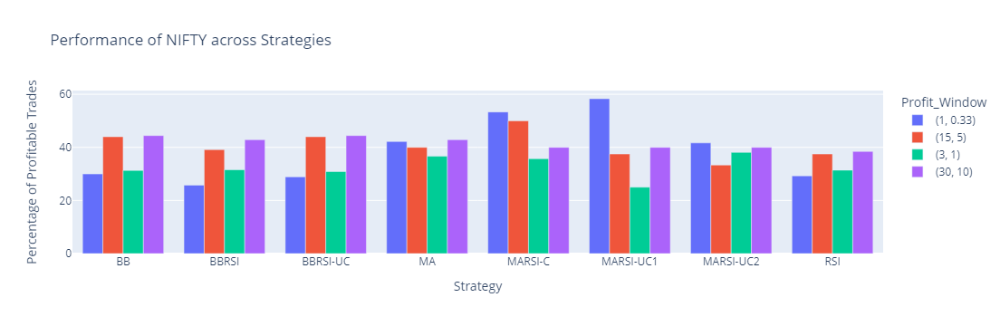

In [26]:
# Create a list of DataFrames containing NIFTY 50, Strategy, and Average columns for each profit window
nifty_dfs = [df[['NIFTY 50', 'Strategy', 'Average']].assign(Profit_Window=profit_window) for profit_window, df in dfs.items()]

# Concatenate the DataFrames
combined_nifty_df = pd.concat(nifty_dfs, ignore_index=True)

# Create a grouped bar chart using Plotly Express
fig = px.bar(combined_nifty_df, x='Strategy', y='NIFTY 50', color='Profit_Window',
             title='Performance of NIFTY across Strategies',
             labels={'NIFTY 50': 'Percentage of Profitable Trades', 'Strategy': 'Strategy'},
             barmode='group')  # Set barmode to 'group' for grouped bars


# Show the plot
fig.show()

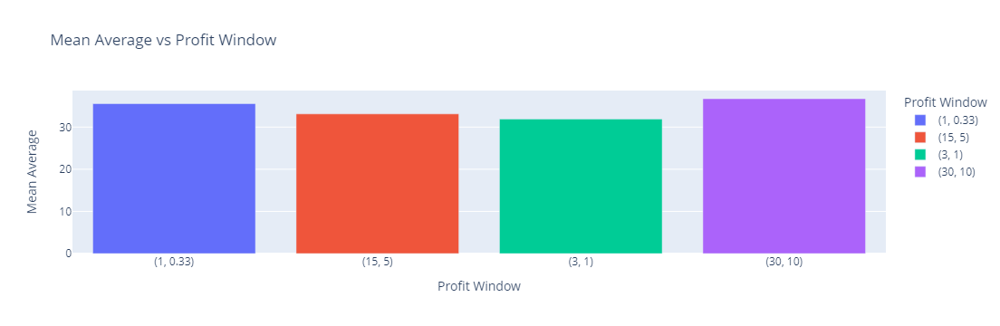

In [27]:
# Calculate the mean of the 'Profit_Window' values
mean_average_by_profit_window = combined_nifty_df.groupby('Profit_Window')['Average'].mean().reset_index()

# Drop rows with NaN values
mean_average_by_profit_window = mean_average_by_profit_window.dropna()

# Create a bar chart using Plotly Express
fig_bar = px.bar(mean_average_by_profit_window, x='Profit_Window', y='Average',
                 color='Profit_Window',
                 labels={'Average': 'Mean Average', 'Profit_Window': 'Profit Window'},
                 title='Mean Average vs Profit Window')

# Show the plot
fig_bar.show()

average_df2 = mean_average_by_profit_window.copy()
average_df2.rename(columns={'Average': '38_Minute'}, inplace=True)

average_df = pd.merge(average_df, average_df2[['Profit_Window', '38_Minute']], on='Profit_Window', how='left')

In [28]:
# Assuming 'dfs' is your dictionary of dataframes
result = find_maximum_value_info(dfs)

result

{'key': '(30, 10)',
 'column_name': 'HDFCBANK',
 'strategy_value': 'BBRSI',
 'max_value': 62.5}

In [29]:
for i in range(len(df_38minute)):
    if df_38minute.loc[i, 'Profit_Loss_Windows'] == result['key'] and df_38minute.loc[i, 'Strategy'] == result['strategy_value']:
        val = i
        print(df_38minute.loc[i, result['column_name']])

[8, 5, 2, 62.5, 1588.5]


In [30]:
result = most_profitable_strategy(dfs)

print("Most Profitable Strategy:", result['strategy'])
print("Maximum Average Profitability:", result['max_value'])
print("Key (DataFrame Identifier):", result['key'])

Most Profitable Strategy: MA
Maximum Average Profitability: 37.41227722772277
Key (DataFrame Identifier): (30, 10)


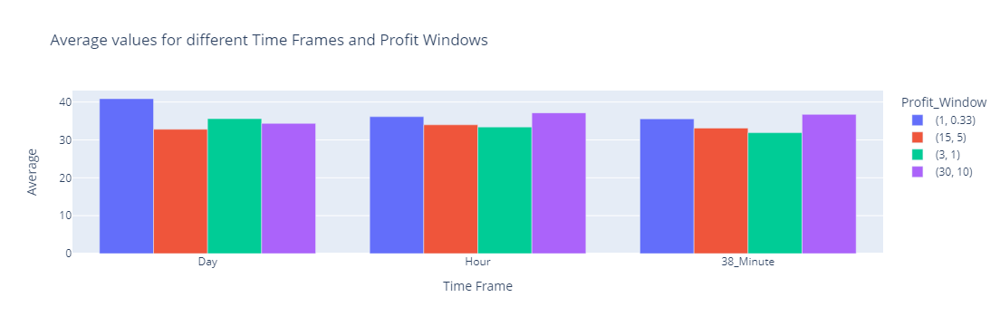

In [31]:
# Melt the DataFrame for Plotly
melted_df = pd.melt(average_df, id_vars='Profit_Window', var_name='Time_Frame', value_name='Average')

# Create the plot
fig = px.bar(melted_df, x='Time_Frame', y='Average',
             color='Profit_Window',
             labels={'Time_Frame': 'Time Frame', 'Average': 'Average'},
             title='Average values for different Time Frames and Profit Windows',
             barmode='group')

# Show plot
fig.show()

## Entry Span Analysis

In [47]:
grouped_df = df_day.groupby('Profit_Loss_Windows')

In [48]:
def convert_to_list(cell_value):
    try:
        # Use ast.literal_eval to safely evaluate the string representation
        return ast.literal_eval(cell_value)
    except (SyntaxError, ValueError):
        return cell_value  # Return the original value if evaluation fails

def extract_fifth_element(lst):
    if len(lst) >= 4:
        return lst[0]
    else:
        return None

In [49]:
dfs = {}
# Iterate through groups, drop 'Profit_Loss_Windows', and store DataFrames in the dictionary
for name, group in grouped_df:
    dfs[name] = group.drop(columns=['Profit_Loss_Windows']).copy()

for key, df in dfs.items():
    dfs[key] = df.map(convert_to_list)

# Extract the fourth element from each DataFrame in the dictionary
for key, df in dfs.items():
    # Apply the function to all columns except the last one
    df.iloc[:, :-1] = df.iloc[:, :-1].apply(lambda col: col.map(extract_fifth_element))
for key, df in dfs.items():
    df['Average']= df.iloc[:,:-1].mean(axis=1)

In [50]:
# Create a list of DataFrames containing NIFTY 50, Strategy, and Average columns for each profit window
nifty_dfs = [df[['NIFTY 50', 'Strategy', 'Average']].assign(Profit_Window=profit_window) for profit_window, df in dfs.items()]

# Concatenate the DataFrames
combined_nifty_df = pd.concat(nifty_dfs, ignore_index=True)

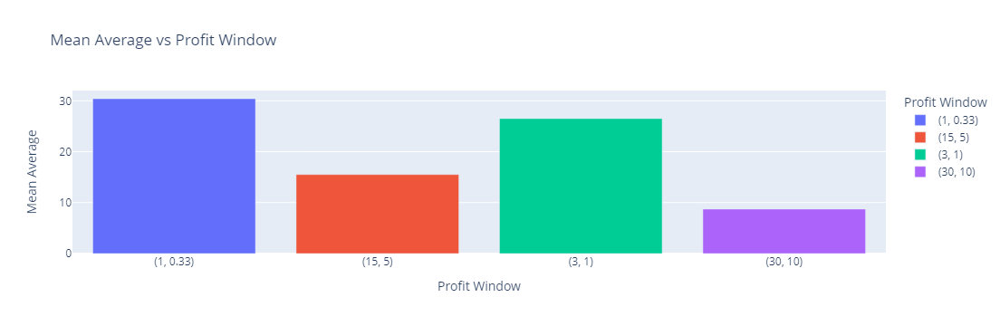

In [51]:
# Calculate the mean of the 'Profit_Window' values
mean_average_by_profit_window = combined_nifty_df.groupby('Profit_Window')['Average'].mean().reset_index()

# Drop rows with NaN values
mean_average_by_profit_window = mean_average_by_profit_window.dropna()

# Create a bar chart using Plotly Express
fig_bar = px.bar(mean_average_by_profit_window, x='Profit_Window', y='Average',
                 color='Profit_Window',
                 labels={'Average': 'Mean Average', 'Profit_Window': 'Profit Window'},
                 title='Mean Average vs Profit Window')

# Show the plot
fig_bar.show()

# Store the values in average_df
average_df_e = mean_average_by_profit_window.copy()
average_df_e.rename(columns={'Average': 'Day'}, inplace=True)

In [52]:
grouped_df = df_60minute.groupby('Profit_Loss_Windows')

In [53]:
dfs = {}
# Iterate through groups, drop 'Profit_Loss_Windows', and store DataFrames in the dictionary
for name, group in grouped_df:
    dfs[name] = group.drop(columns=['Profit_Loss_Windows']).copy()

for key, df in dfs.items():
    dfs[key] = df.map(convert_to_list)

# Extract the fourth element from each DataFrame in the dictionary
for key, df in dfs.items():
    # Apply the function to all columns except the last one
    df.iloc[:, :-1] = df.iloc[:, :-1].apply(lambda col: col.map(extract_fifth_element))
for key, df in dfs.items():
    df['Average']= df.iloc[:,:-1].mean(axis=1)

In [54]:
# Create a list of DataFrames containing NIFTY 50, Strategy, and Average columns for each profit window
nifty_dfs = [df[['NIFTY 50', 'Strategy', 'Average']].assign(Profit_Window=profit_window) for profit_window, df in dfs.items()]

# Concatenate the DataFrames
combined_nifty_df = pd.concat(nifty_dfs, ignore_index=True)

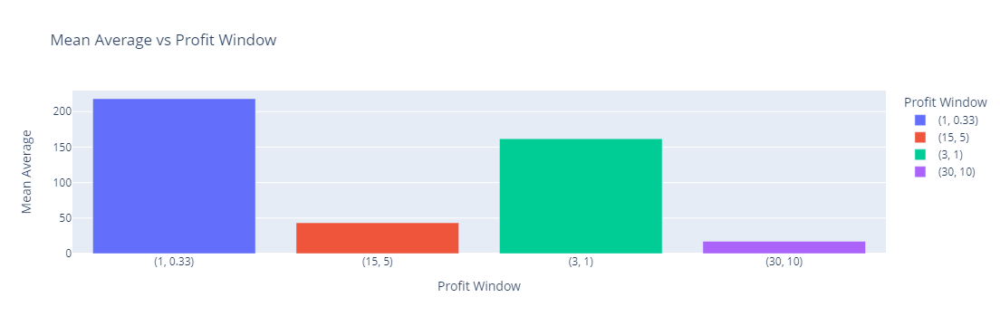

In [55]:
# Calculate the mean of the 'Profit_Window' values
mean_average_by_profit_window = combined_nifty_df.groupby('Profit_Window')['Average'].mean().reset_index()

# Drop rows with NaN values
mean_average_by_profit_window = mean_average_by_profit_window.dropna()

# Create a bar chart using Plotly Express
fig_bar = px.bar(mean_average_by_profit_window, x='Profit_Window', y='Average',
                 color='Profit_Window',
                 labels={'Average': 'Mean Average', 'Profit_Window': 'Profit Window'},
                 title='Mean Average vs Profit Window')

# Show the plot
fig_bar.show()

average_df1 = mean_average_by_profit_window.copy()
average_df1.rename(columns={'Average': 'Hour'}, inplace=True)

average_df_e = pd.merge(average_df_e, average_df1[['Profit_Window', 'Hour']], on='Profit_Window', how='left')

In [56]:
grouped_df = df_38minute.groupby('Profit_Loss_Windows')

In [57]:
dfs = {}
# Iterate through groups, drop 'Profit_Loss_Windows', and store DataFrames in the dictionary
for name, group in grouped_df:
    dfs[name] = group.drop(columns=['Profit_Loss_Windows']).copy()

for key, df in dfs.items():
    dfs[key] = df.map(convert_to_list)

# Extract the fourth element from each DataFrame in the dictionary
for key, df in dfs.items():
    # Apply the function to all columns except the last one
    df.iloc[:, :-1] = df.iloc[:, :-1].apply(lambda col: col.map(extract_fifth_element))
for key, df in dfs.items():
    df['Average']= df.iloc[:,:-1].mean(axis=1)

In [58]:
# Create a list of DataFrames containing NIFTY 50, Strategy, and Average columns for each profit window
nifty_dfs = [df[['NIFTY 50', 'Strategy', 'Average']].assign(Profit_Window=profit_window) for profit_window, df in dfs.items()]

# Concatenate the DataFrames
combined_nifty_df = pd.concat(nifty_dfs, ignore_index=True)

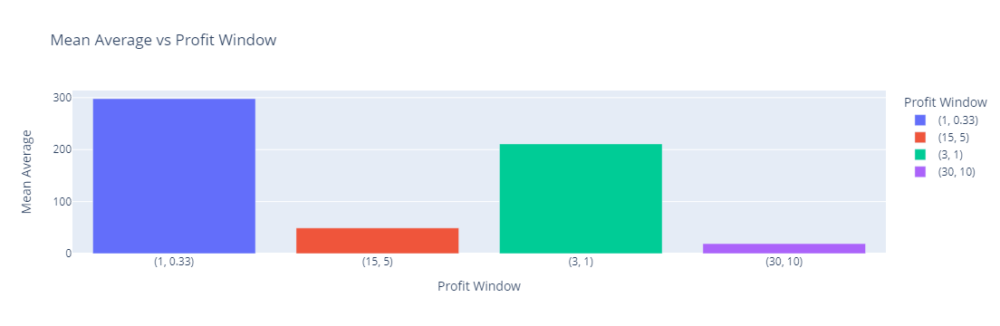

In [59]:
# Calculate the mean of the 'Profit_Window' values
mean_average_by_profit_window = combined_nifty_df.groupby('Profit_Window')['Average'].mean().reset_index()

# Drop rows with NaN values
mean_average_by_profit_window = mean_average_by_profit_window.dropna()

# Create a bar chart using Plotly Express
fig_bar = px.bar(mean_average_by_profit_window, x='Profit_Window', y='Average',
                 color='Profit_Window',
                 labels={'Average': 'Mean Average', 'Profit_Window': 'Profit Window'},
                 title='Mean Average vs Profit Window')

# Show the plot
fig_bar.show()

average_df2 = mean_average_by_profit_window.copy()
average_df2.rename(columns={'Average': '38_Minute'}, inplace=True)

average_df_e = pd.merge(average_df_e, average_df2[['Profit_Window', '38_Minute']], on='Profit_Window', how='left')

In [60]:
print(average_df_e)

  Profit_Window        Day        Hour   38_Minute
0     (1, 0.33)  30.414604  218.210396  297.982673
1       (15, 5)  15.513614   43.294554    49.22896
2        (3, 1)  26.518564  161.886139  211.061881
3      (30, 10)   8.736386   17.274752    18.97401


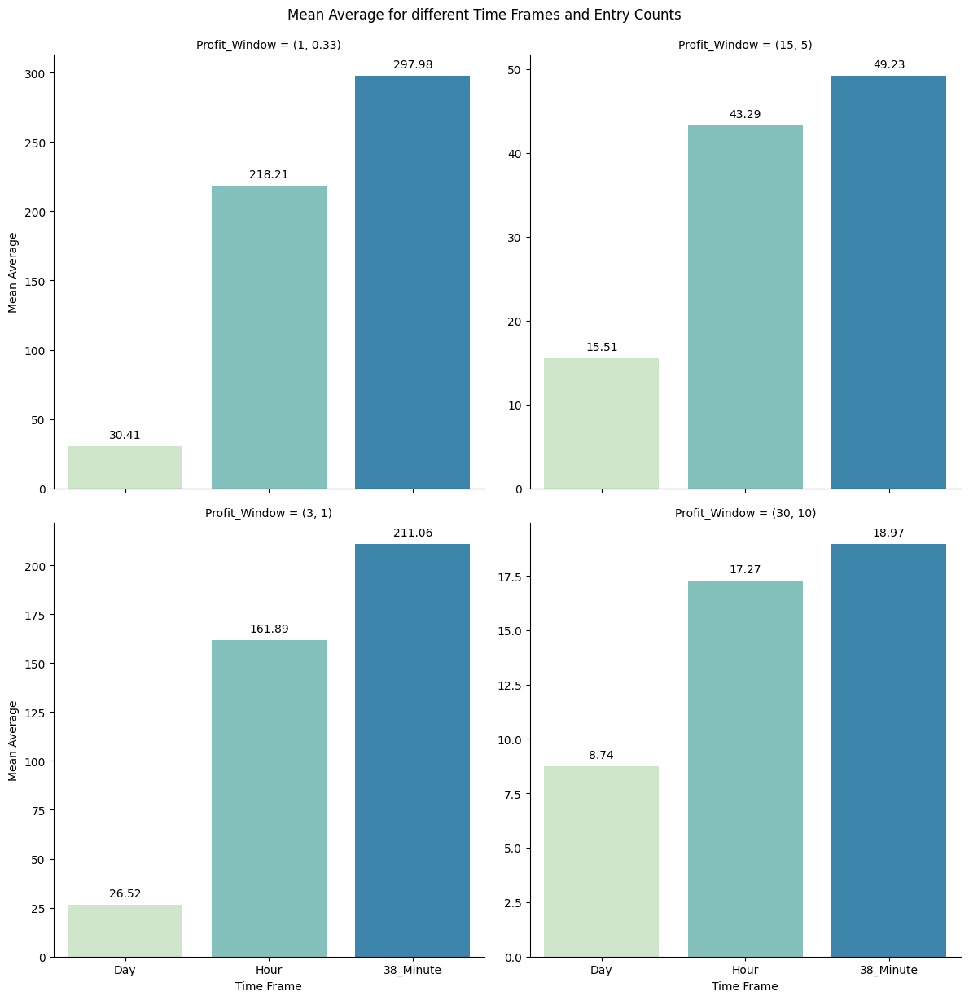

In [61]:
# Melt the DataFrame for Seaborn
melted_df = pd.melt(average_df_e, id_vars='Profit_Window', var_name='Time_Frame', value_name='Mean_Average')

# Create separate plots for each Profit_Window with different scales
g = sns.FacetGrid(melted_df, col='Profit_Window', col_wrap=2, height=6, sharey=False)
g.map(sns.barplot, 'Time_Frame', 'Mean_Average', palette='GnBu')

# Adding labels and title
g.set_axis_labels('Time Frame', 'Mean Average')
g.fig.suptitle('Mean Average for different Time Frames and Entry Counts', y=1.02)

# Annotate each bar with its corresponding value
for ax in g.axes.flat:
    for p in ax.patches:
        ax.annotate(f'{p.get_height():.2f}', (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center', va='center', xytext=(0, 10), textcoords='offset points')

# Show the plots
plt.show()
g.savefig('output_plot.png', bbox_inches='tight')